# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:
negatives = 'dataset/train/Negatives'
positives = 'dataset/train/positives'


In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR negatives:

======== Images in:  dataset/train/Negatives
Images_count :	 147
Min_width :	 1000
Max_width :	 1000
Min_height :	 901
Max_height :	 1116



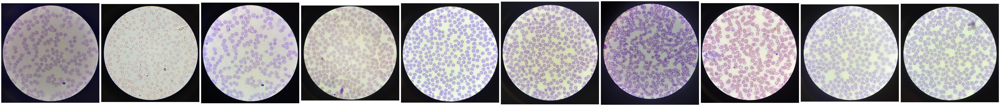

In [5]:
print("")
print("TRAINING DATA FOR negatives:")
print("")
images_details(negatives)
print("")
plot_images(negatives, 10) 


TRAINING DATA FOR positives:

======== Images in:  dataset/train/positives
Images_count :	 422
Min_width :	 469
Max_width :	 4160
Min_height :	 436
Max_height :	 3440



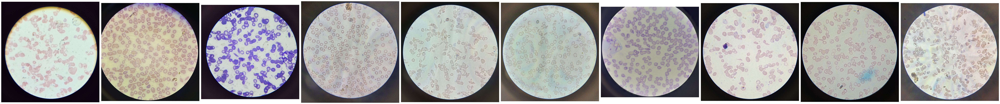

In [6]:
print("")
print("TRAINING DATA FOR positives:")
print("")
images_details(positives)
print("")
plot_images(positives, 10)

In [7]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('DATASET/TRAIN',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 569 images belonging to 2 classes.


In [8]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('DATASET/TEST',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 569 images belonging to 2 classes.


In [9]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(2, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [10]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [11]:
epochs = 10
batch_size = 512

In [12]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10


1/1 [==============================] - ETA: 0s - loss: 0.6905 - accuracy: 0.5625
Epoch 1: accuracy improved from -inf to 0.56250, saving model to MANUAL.h5
1/1 [==============================] - 5s 5s/step - loss: 0.6905 - accuracy: 0.5625 - val_loss: 97.7485 - val_accuracy: 0.3750
Epoch 2/10
1/1 [==============================] - ETA: 0s - loss: 114.1330 - accuracy: 0.2800
Epoch 2: accuracy did not improve from 0.56250
1/1 [==============================] - 3s 3s/step - loss: 114.1330 - accuracy: 0.2800 - val_loss: 18.2630 - val_accuracy: 0.7500
Epoch 3/10
1/1 [==============================] - ETA: 0s - loss: 20.1747 - accuracy: 0.7200
Epoch 3: accuracy improved from 0.56250 to 0.72000, saving model to MANUAL.h5
1/1 [==============================] - 4s 4s/step - loss: 20.1747 - accuracy: 0.7200 - val_loss: 15.6690 - val_accuracy: 0.6875
Epoch 4/10
1/1 [==============================] - ETA: 0s - loss: 14.0227 - accuracy: 0.6875
Epoch 4: accuracy did not improve from 0.7

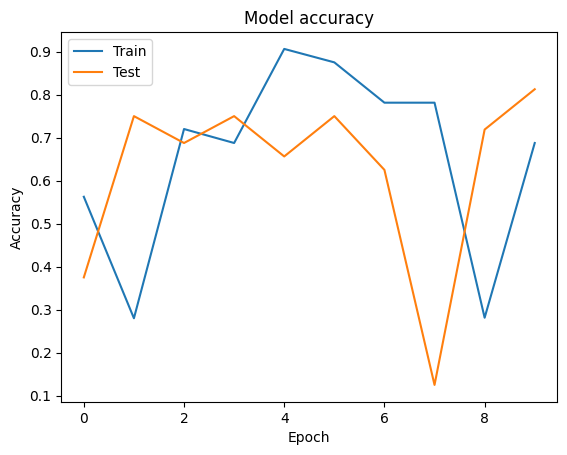

In [13]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

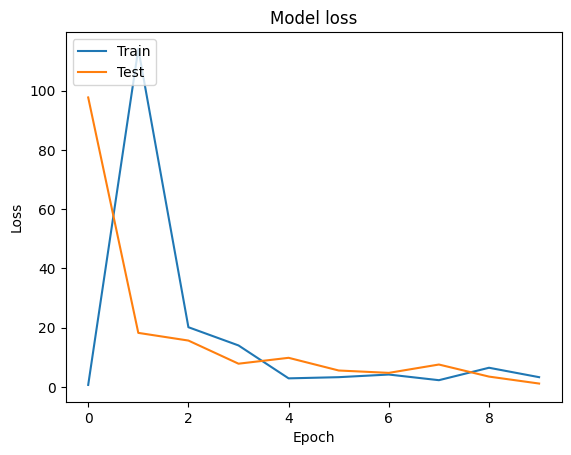

In [14]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()